### Setup GRASS GIS

In [1]:
import sys
import os
import subprocess
from pathlib import Path
from urllib.parse import urlencode
from IPython.display import display
import pandas as pd
import seaborn as sns

# Ask GRASS GIS where its Python packages are and add them to the path
sys.path.append(
    subprocess.check_output(["grass", "--config", "python_path"], text=True).strip()
)

# Import the GRASS GIS python packages we need
import grass.script as gs
import grass.jupyter as gj

grassdata = "./grassdata"
project_name = "nc_spm_08_grass7"
mapset = "PERMANENT"

# Start GRASS in the recently created project
gj.init(grassdata, project_name, mapset)


In [2]:
#!g.list type=raster

### User: Can you visualiza elevation raster?

Assistant: Sure. Below is the code and visualization. I can give you only code or only display if you want.

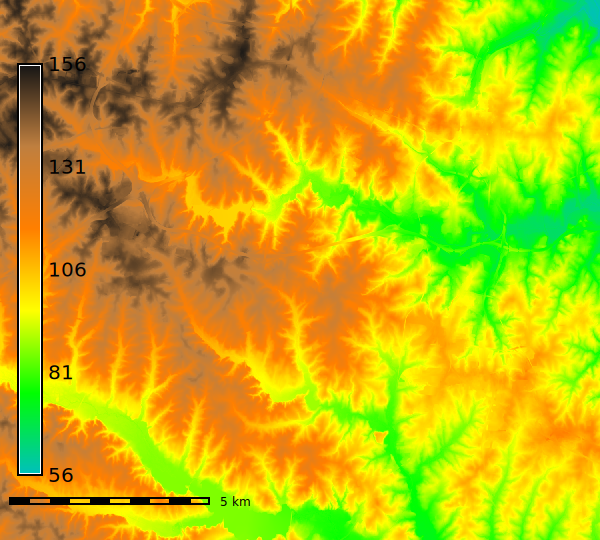

In [3]:
elev = gj.Map()
elev.d_rast(map="elevation") # d.rast map=elevation
elev.d_barscale(bgcolor="none") # d.barscale
elev.d_legend(raster="elevation") #d.legend
elev.show()

### User: Can you compute slope and aspect from the elevation data?

Assistant: Sure. Below is the code to compute slope and aspect from the elevation data.

In [4]:
gs.run_command("g.region", raster="elev_ned_30m")
gs.run_command("r.slope.aspect", elevation="elevation", slope="slope", aspect="aspect", overwrite=True)


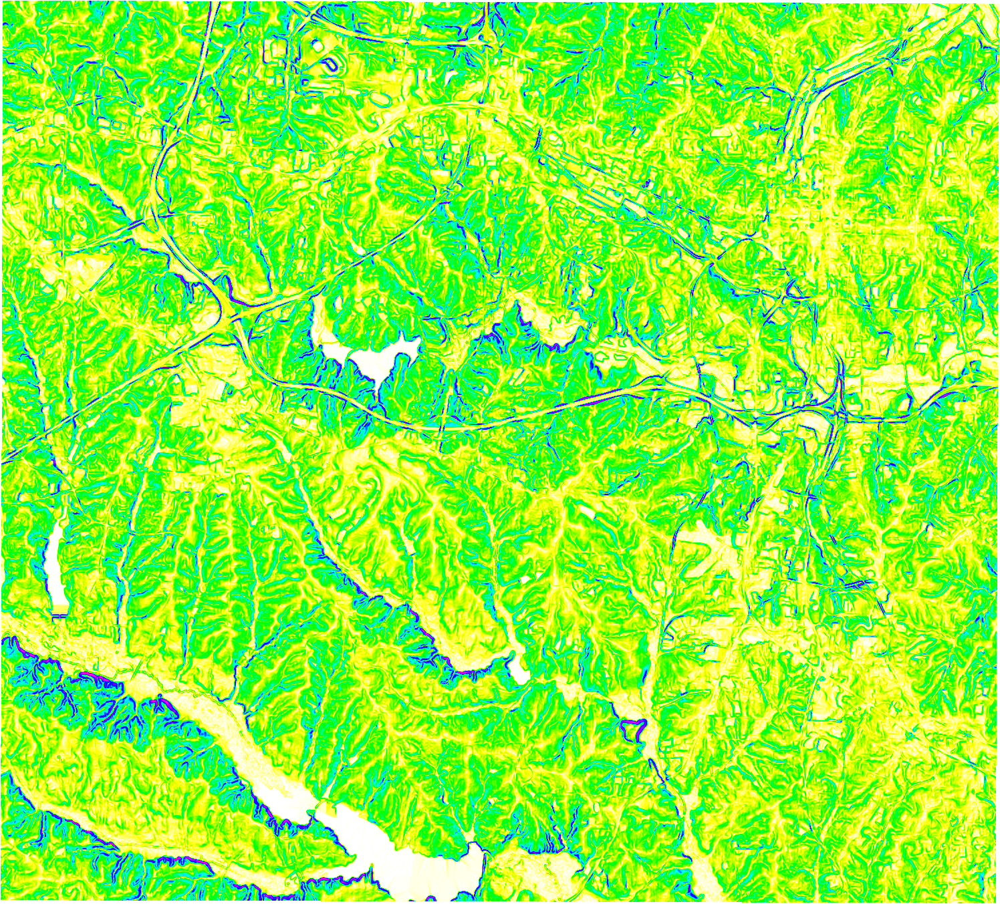
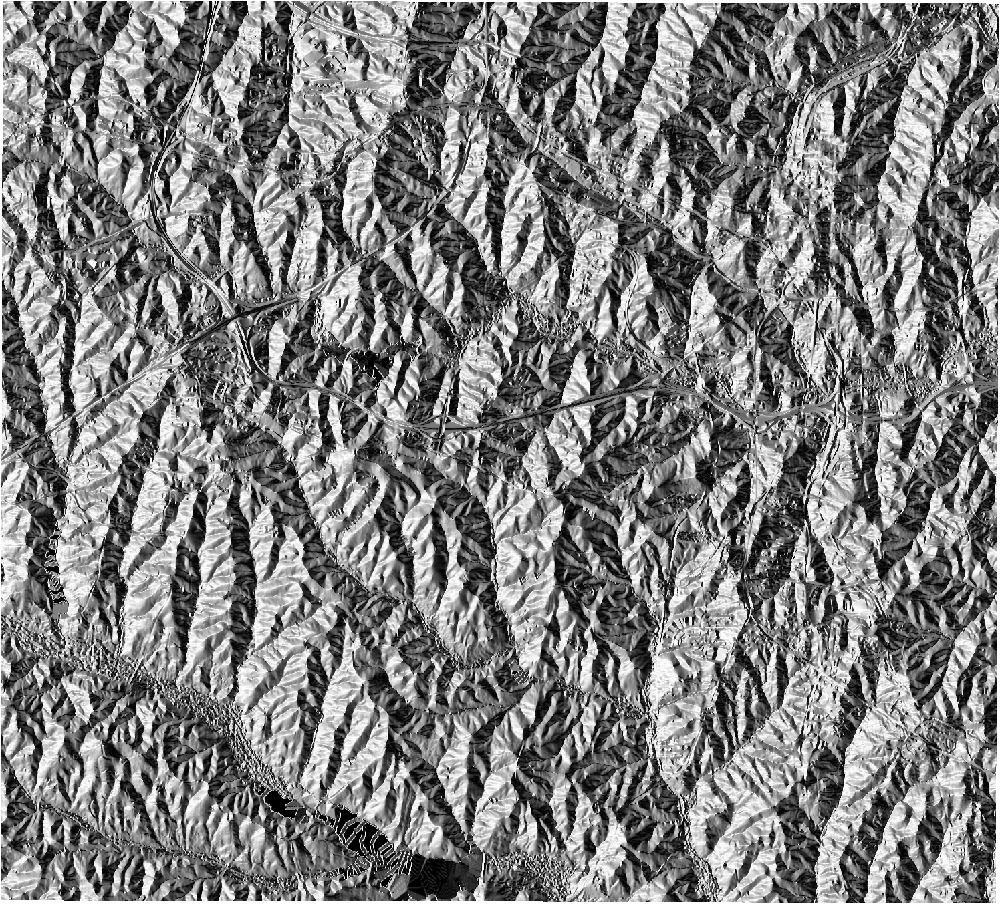

In [31]:
asp_slp=gj.InteractiveMap(tiles="OpenStreetMap")
asp_slp.add_raster("slope")
asp_slp.add_raster("aspect")
asp_slp.add_layer_control()
asp_slp.show()

### User: Can you run flow lines in the elevation raster?

Assistant : Below is the code to run flow lines(ie. streams). The generated accumulation rasters are the streams. only streams more than 100 were exporetd as generated streams and those streams were converted into vector for better visualization. In the visualized map, lakes, generated streams and streams from national hydrological data are shown.

In [6]:
gs.run_command("g.region", raster="elev_ned_30m")
gs.run_command("r.watershed",
              elevation="elev_ned_30m",
               threshold=1000,
               accumulation="accum_10k",
               drainage="draindir_10k",
               basin="basin_10k",
               overwrite=True
              )

In [7]:
#Extract more detailed streams from flow accumulation raster
gs.run_command("r.mapcalc",
    expression="streams_der_30m = if(abs('accum_10k') > 100, 1, null())",
    overwrite=True
            
)

In [8]:
#Convert to vector format and display results along with the official Wake county streams (red):
# Convert raster to vector (basin areas)
gs.run_command(
    "r.to.vect",
    input="basin_10k",
    output="basin_10k",
    type="area",
    flags="s",
    quiet=True,
    overwrite=True
)

# Thin stream raster to get a clean line representation
gs.run_command(
    "r.thin",
    input="streams_der_30m",
    output="streams_der_30m_t",
    quiet=True,
    overwrite=True
)

# Convert thinned raster streams to vector lines
gs.run_command(
    "r.to.vect",
    input="streams_der_30m_t",
    output="streams_der_30m",
    type="line",
    flags="s",
    quiet=True,
    overwrite=True
)


In [9]:
#!g.list type=vect

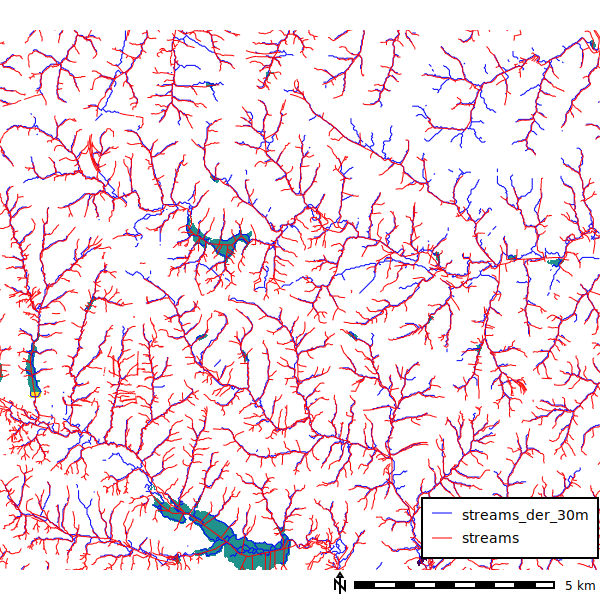

In [10]:
# Create Map instance
flow_map = gj.Map(height=600, width=600)
# Add the elevation raster to the map
flow_map.d_rast(map="lakes") #for better visualization
flow_map.d_vect(map="streams_der_30m", color="blue") #Generated streams(lines in blue color)
flow_map.d_vect(map="streams", color="red") # Original Streams from hydrological data
flow_map.d_legend_vect(at=[72,17], flags="b")
flow_map.d_barscale(at=[55,5], flags="n")
display(flow_map.show())



### User: Create watershed basins for the given elevation raster?

Assistant: Sure following is the code to display basins computed above.

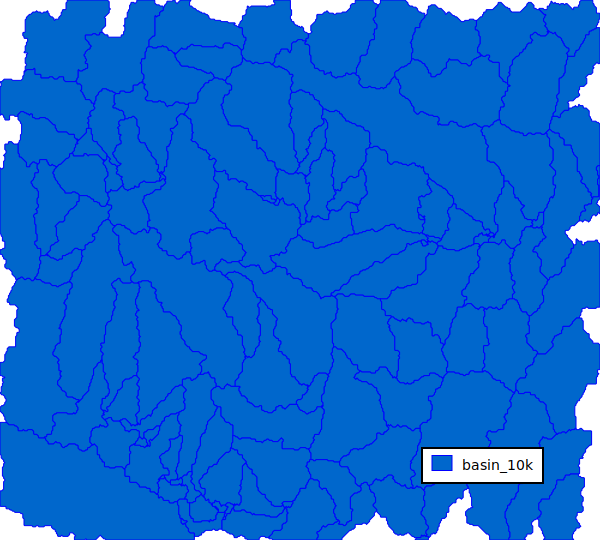

In [11]:
basin=gj.Map()
basin.d_vect(map="basin_10k", color="blue")
basin.d_legend_vect(at=[72,17], flags="b")
basin.show()

### User: Can you run overland flow?

Asssistant: Sure! Below is the code to run overland flow. And overland flow map.


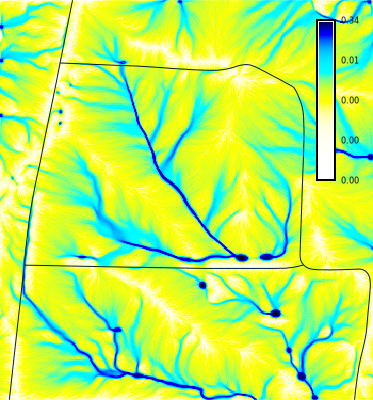

In [12]:
gs.run_command("g.region",region="rural_1m", res=2)
gs.run_command("v.surf.rst",
              input="elev_lid792_bepts",
              elevation="elev_lid792_2m",
              slope="dx_2m",
              aspect="dy_2m",
              tension=15, 
              smooth=1.5,
              npmin=150,
              flags="d",
              overwrite=True)

increment=2
gs.run_command("r.sim.water",
               elevation="elev_lid792_2m",
               dx="dx_2m",
               dy="dy_2m",
               rain_value=50,
               nwalk=10000,
               depth="wdp_2m",
               discharge="disch_2m",
               niter=10,
               overwrite=True,
              flags="t")

map=gj.Map(use_region=True)
map.d_rast(map="disch_2m")
map.d_vect(map="streets_wake")
map.d_legend(raster="disch_2m.02",at=(55,95,85,90), flags="l")
display(map.show())

In [13]:
#!g.list type=raster

### User: can you create a animation of flowing water using overland flow?

Assistant: Sure below is the code and visualized animation. We reusedd code above to compute water depth and used followinf code to display timeseries map.

In [14]:
increment=2

gs.run_command(
    "t.create",
    output="wdp_2m",
    type="strds",
    temporaltype="relative",
    semantictype="sum",
    title="Water Depth",
    description="Water Depth from r.sim.water",
)

wdp_list = gs.read_command(
    "g.list", type="raster", pattern="wdp_2m*", separator="comma"
).strip()

gs.run_command(
    "t.register",
    input="wdp_2m",
    type="raster",
    start=0,
    increment=increment,
    unit="minute",
    maps=wdp_list,
    flags="i",
)

In [15]:
gs.run_command("g.region",region="rural_1m", res=2)
water_depth = gj.TimeSeriesMap(use_region=True, width=800)
water_depth.add_raster_series("wdp_2m")
water_depth.d_legend()
water_depth.show()

### User: Can you create a lake at given point to given level?

Assistant: Sure below is the code and map.

In [16]:
gs.run_command("g.region", raster="elev_lid792_1m", flags="p")

projection: 99 (Lambert Conformal Conic)
zone:       0
datum:      nad83
ellipsoid:  a=6378137 es=0.006694380022900787
north:      220750
south:      220000
west:       638300
east:       639000
nsres:      1
ewres:      1
rows:       750
cols:       700
cells:      525000


In [17]:
gs.run_command("r.lake",elevation="elev_lid792_1m", coordinates="638759.3,220264.1", water_level=113.4, lake="flooding")

projection: 99 (Lambert Conformal Conic)
zone:       0
datum:      nad83
ellipsoid:  a=6378137 es=0.006694380022900787
north:      220750
south:      220000
west:       638300
east:       639000
nsres:      1
ewres:      1
rows:       750
cols:       700
cells:      525000


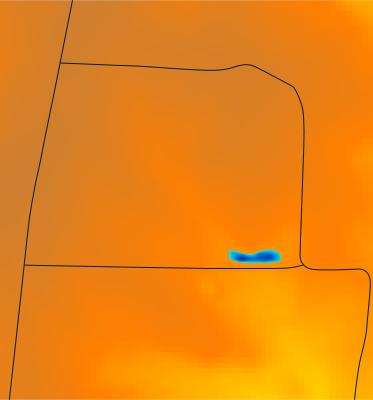

In [18]:
gs.run_command("g.region", raster="flooding", flags="p")
lake=gj.Map(use_region=True)
lake.d_rast(map="elevation")
lake.d_vect(map="streets_wake")
lake.d_rast(map="flooding")
lake.show()

### User: Is it possible to create 100 m buffer around streams using GRASS?

Assistant: Yes, its possible. You can see below how it works.

projection: 99 (Lambert Conformal Conic)
zone:       0
datum:      nad83
ellipsoid:  a=6378137 es=0.006694380022900787
north:      228500
south:      215000
west:       630000
east:       645000
nsres:      30
ewres:      30
rows:       450
cols:       500
cells:      225000


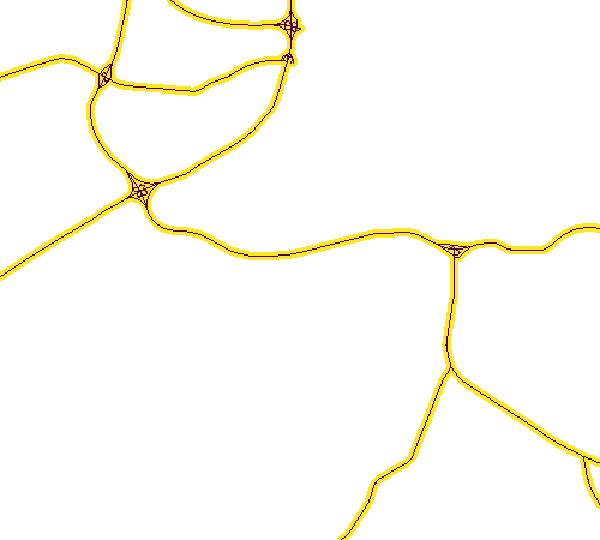

In [19]:
gs.run_command("g.region", raster="roadsmajor", flags="p")
gs.run_command("r.buffer", input="roadsmajor", output="roadsmajor_buffer", distance=100)
road=gj.Map()
road.d_rast(map="roadsmajor_buffer")
road.show()

### User: Is it possible to create multiple buffers around streams using GRASS?

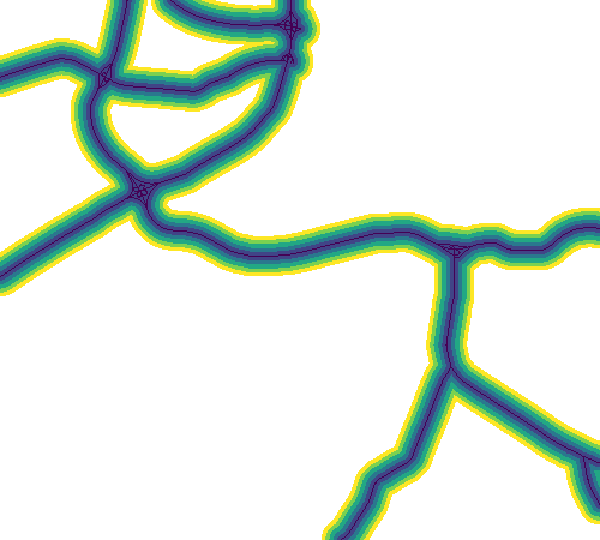

In [20]:
gs.run_command("r.buffer", input="roadsmajor", output="roadsmajor_buffer_mul", distance="100,200,300,400,500")
road_mul=gj.Map()
road_mul.d_rast(map="roadsmajor_buffer_mul")
road_mul.show()

### User: Can you generate vector map of specified contours from a raster map?

Assistant: Below is the code and how the visualization looks like.

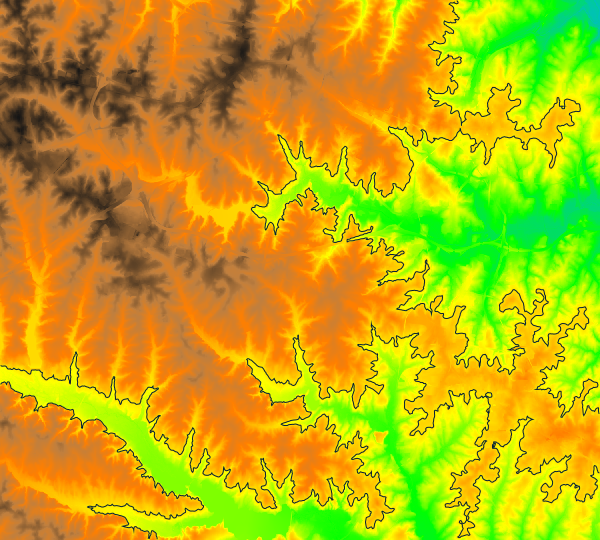

In [21]:
gs.run_command("r.contour",input="elevation", output="elevation_contours", minlevel=1000,maxlevel=2000, step=100, cut=200)

contourmap=gj.Map()
contourmap.d_rast(map="elevation")
contourmap.d_vect(map="elevation_contours")
contourmap.show()

### User: Can you compute multiple level contours from the elevation raster?

Assistant: Yes I can. Below is the code to compute multiple contours and interactive visualization of the contours. You can zoom in or out to explore the result.

In [22]:
gs.run_command("r.contour",input="elevation", output="con_multiple_col", step=10, overwrite=True)

In [23]:
!v.db.select map=con_multiple_col

cat|level
1|60
2|70
3|80
4|90
5|100
6|110
7|120
8|130
9|140
10|150


In [24]:
!v.colors map=con_multiple_col use=attr column=level color=gyr

Converting color rules into categories...
   0  10  20  30  40  50  60  70  80  90 100
Writing color rules...
Color table for vector map <con_multiple_col@PERMANENT> set to 'gyr'


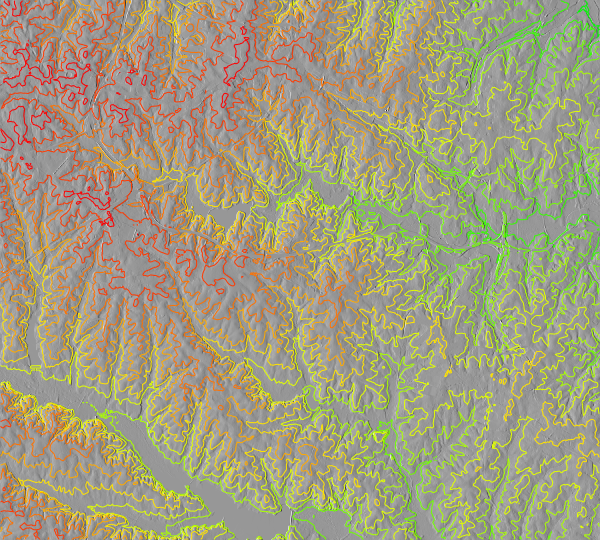

In [25]:
contourmap=gj.Map()
#contourmap.d_rast(map="elevation")
contourmap.d_rast(map="elevation_shade")
contourmap.d_vect(map="con_multiple_col")
contourmap.show()

In [26]:
import folium
import json
import matplotlib.cm as cm
import matplotlib.colors as mcolors
# con_file = gj.Vector("con_multiple_col")._filename
vect = gj.Vector("con_multiple_col")

with open(vect._filename, encoding="utf-8") as file:
    data = json.load(file)

In [27]:
import folium

# Define your vector map name
vector_map = "con_multiple_col"

# Export the vector to GeoJSON (must be in WGS84)
geojson_path = f"/tmp/{vector_map}.geojson"
gs.run_command(
    "v.out.ogr",
    input=vector_map,
    output=geojson_path,
    format="GeoJSON",
    overwrite=True
)

In [28]:

# Create a Folium map centered around the vector map
m = folium.Map(location=[35.761168, -78.668271], zoom_start=13)

# Load the vector data
vect = gj.Vector("con_multiple_col")

with open(vect._filename, encoding="utf-8") as file:
    data = json.load(file)

# Extract all contour levels to determine the color scale range
levels = [feature["properties"]["level"] for feature in data["features"]]
min_level = min(levels)
max_level = max(levels)

# Create a color map
cmap = cm.get_cmap("Spectral")
norm = mcolors.Normalize(vmin=min_level, vmax=max_level)

# Define the style function
def style_function(feature):
    level = feature["properties"]["level"]
    rgba_color = cmap(norm(level))
    hex_color = mcolors.rgb2hex(rgba_color)
    return {
        'fillColor': hex_color,
        'color': hex_color,
        'weight': 2,
        'fillOpacity': 0.7
    }

# Add the GeoJSON vector to the map with the style function
folium.GeoJson(
    data,
    style_function=style_function
).add_to(m)

# Show the map
m


/tmp/ipykernel_77597/2891353316.py:16: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("Spectral")


In [29]:
#This is the code block for same color
# # Create a Folium map centered around the vector map
# m = folium.Map(location=[35.761168, -78.668271], zoom_start=13)

# vect = gj.Vector("con_multiple_col")

# with open(vect._filename, encoding="utf-8") as file:
#     data = json.load(file)

# # Add the GeoJSON vector to the map
# folium.GeoJson(
#     data
# ).add_to(m)

# # Show the map
# m

### User: I'm currently standing in my field. Could you determine whether this location is at risk of flooding?

Assistant: Sure. I have written the steps below to show how the flood pattern—looks.
If you are inside blue color it looks like you’re right in the path! Better run while you can! otherwise you do not need to worry.